In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
np.set_printoptions(formatter={'float': '{: 0.3f}'.format})

In [5]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [6]:
import torch
import socket
from IPython.display import clear_output

In [7]:
import itertools
import multiprocessing as mp

In [8]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 0

In [9]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [10]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] <= tot_day_radiation <= bin_edges[k]):
                day_state = k -1
                break
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True

                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [11]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 50.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.85*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the battery level for each day
        self.v_btrack = []      #track the virtual battery level for each day

        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        self.v_btrack = np.append(self.v_btrack, self.batt) #track battery levels
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        bmean = np.mean(self.btrack)
        bdev = self.BOPT - bmean
        if np.abs(bdev) > (self.BOPT - self.ENP_MARGIN):
            reward = 1.5-np.abs(bdev)/self.BMAX*5
        else:
            reward = 1
#         reward = 2 - 20*np.abs(bdev)/self.BMAX
#         if(self.day_violation_flag):
#             violation_penalty += 3    #penalty for violating battery limits anytime during the day
        return np.clip(reward,-1,1)#(reward - violation_penalty)
    
    
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        
#         v_batt = self.binit + self.htrack.sum() - self.atrack.sum()*self.DMAX/self.N_ACTIONS
#         self.v_btrack = np.append(self.v_btrack, v_batt) #track battery levels
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
#         if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2

        if(self.batt <= self.BMIN ): 
            self.batt_empty_counter += 1
        if(self.batt >= self.BMAX ): 
            self.batt_full_counter  += 1

        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
#             self.v_btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [12]:
RNDM_STRING = ''.join(random.choices(string.ascii_uppercase + string.digits, k=8))# + datetime.now().strftime("_%H_%M_%S")

LOCATION       = 'tokyo'
NAME           = 'DENO'+ RNDM_STRING+ '_'+datetime.now().strftime("_%H_%M_%S")+"_"
MODEL_FILENAME = './models/'+ NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", MODEL_FILENAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  ./models/DENOSTI6WR1Z__13_29_49__161.pt
SEED  :  0
HOST  :  19c994a59e65
START :  2019-07-04 13:29:49.187922


In [13]:
# Hyper Parameters
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.99           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*3*10   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NN_ITERATIONS       = 240
GPU                 = False         # device
HELP                = 0.05
print("HYPERPARAMETERS")

HYPERPARAMETERS


In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)

        self.adv = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.adv.weight) 
    
        self.val = nn.Linear(HIDDEN_LAYER, 1)
        nn.init.xavier_uniform_(self.val.weight)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)

        adv = self.adv(x)
        val = self.val(x)
        
        return val + adv - adv.mean()
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)

        self.running_loss = 0.0
        
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    
#     def choose_action(self, x):
#         x = torch.unsqueeze(torch.FloatTensor(x), 0)
#         x = x.to(self.device)

#         actions_value = self.eval_net.forward(x)
#         actions_value = actions_value.to(torch.device("cpu"))
#         action = torch.max(actions_value, 1)[1].data.numpy()
#         action = action[0] # return the argmax index
#         if np.random.uniform() > EPSILON:   # greedy
# #             action += np.random.randint(-3, 3)
# #             action = int(np.clip(action, 0, N_ACTIONS-1))
# #             action = np.random.randint(0,N_ACTIONS)
#             action = np.random.choice(np.arange(0, N_ACTIONS), p=[0.55, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05])

#         return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy().flatten()
        action = action[0] # return the argmax index
        
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index_limit = min(MEMORY_CAPACITY, self.memory_counter)
        sample_index = np.random.choice(sample_index_limit, BATCH_SIZE)
#         sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval   = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        a_eval   = self.eval_net(b_s).max(1)[1].view(BATCH_SIZE, 1) #best action according to eval_net
        q_next   = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.gather(1, a_eval)   # shape (batch, 1)
        loss     = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.running_loss += loss.mean().item()
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            print('LOSS : %.3f' %(self.running_loss / TARGET_REPLACE_ITER))
            self.running_loss = 0.0

In [15]:
c_init      = CAPM()
c_init.eno  = ENO()
c_init.HMAX = c_init.eno.SMAX

In [16]:
# CONSTANTS
BMAX = c_init.BMAX
HMAX = c_init.HMAX

In [17]:
#DISCRETIZING LIMITS 

B_MAX = c_init.BMAX
B_MIN = 0

ENP_MAX =  c_init.BMAX
ENP_MIN = -c_init.BMAX

H_MAX =  c_init.HMAX
H_MIN =  0

F_MAX = c_init.NO_OF_DAYTYPE - 1
F_MIN = 0

In [18]:
def normalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s/normalizer[None,:]        

In [19]:
def denormalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s*normalizer[None,:]    

In [20]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]

In [21]:
def batch_stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s - MU[None, :]
    return X/SD[None,:]

def batch_destdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s*SD[None, :]
    return X + MU[None,:]

In [22]:
NO_OF_NODES = 10
LOCATION = 'tokyo'
my_dqn = DQN()

In [23]:
def T_ENO(node_id, day, sc_EPSILON, param_file, capm):
    my_capm = capm
    my_capm.eno.hr = 0
    experience_record = np.empty((my_capm.eno.TIME_STEPS ,N_STATES * 2 + 2))

    my_dqn.eval_net.load_state_dict(torch.load(param_file))
    my_dqn.eval_net.eval()
    np.random.seed(node_id+day)

    my_EPSILON = sc_EPSILON
    PREF = 0.0
#     PREF = 1-my_EPSILON

    s = my_capm.getstate()
    

    my_prob = [(1-PREF)/NO_OF_NODES]*NO_OF_NODES
    my_prob[int((node_id)%N_ACTIONS)] += PREF
    
    while True:
        
        if np.random.uniform() > my_EPSILON:
            a = np.random.choice(np.arange(0, N_ACTIONS), p=my_prob)
        else:
            a = my_dqn.choose_greedy_action(stdize(s))

        
        # take action
        s_, r, day_end, year_end = my_capm.step(a)

        # store experience   
        experience_record[int(my_capm.eno.hr-1)] = np.hstack((stdize(s), [a, r], stdize(s_)))

        s = s_
        
        if day_end:
            experience_record[:,N_STATES + 1]  = r
            break
            

    
    
    return [experience_record, my_capm]

In [24]:
dqn = DQN()
torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
dqn.eval_net.eval()
pool = mp.Pool(processes=NO_OF_NODES)

0 0.1
2000
0 0.1
1 0.1
2 0.11960784313725491
3 0.13846153846153847
4 0.15660377358490568
5 0.17407407407407408
6 0.19090909090909092
7 0.20714285714285713
8 0.22280701754385965
9 0.23793103448275862
10 0.25254237288135595
11 0.26666666666666666
12 0.28032786885245903
13 0.2935483870967742
14 0.30634920634920637
15 0.31875
16 0.3307692307692308
17 0.3424242424242424
18 0.35373134328358213
19 0.3647058823529412
20 0.3753623188405797
21 0.3857142857142857
22 0.39577464788732397
23 0.40555555555555556
24 0.41506849315068495
25 0.4243243243243243
26 0.43333333333333335
27 0.4421052631578948
28 0.45064935064935063
29 0.458974358974359
30 0.46708860759493676
31 0.475
32 0.48271604938271606
33 0.4902439024390244
34 0.49759036144578317
35 0.5047619047619047
36 0.5117647058823529
37 0.5186046511627908
38 0.5252873563218391
39 0.5318181818181819
40 0.5382022471910113
41 0.5444444444444444
42 0.5505494505494506
43 0.5565217391304348
44 0.5623655913978495
45 0.5680851063829787
46 0.5736842105263158

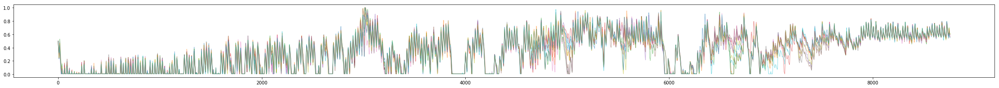

1 0.9792270531400966
2000
LOSS : 0.237
LOSS : 0.255
LOSS : 0.277
LOSS : 0.300
LOSS : 0.321
LOSS : 0.337
LOSS : 0.377


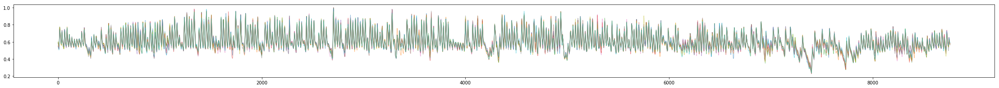

2 0.9792270531400966
2000
LOSS : 0.411
LOSS : 0.425
LOSS : 0.467
LOSS : 0.478
LOSS : 0.511
LOSS : 0.537
LOSS : 0.555


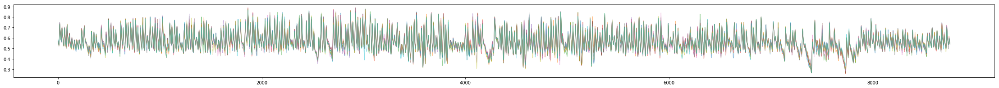

3 0.9792270531400966
2000
LOSS : 0.457
LOSS : 0.313
LOSS : 0.223
LOSS : 0.187
LOSS : 0.100
LOSS : 0.057
LOSS : 0.053


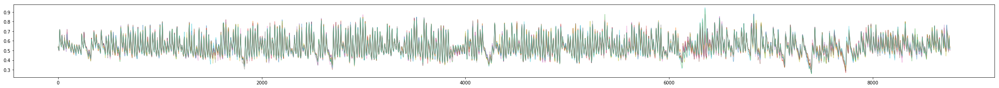

4 0.9792270531400966
2000
LOSS : 0.051
LOSS : 0.048
LOSS : 0.048
LOSS : 0.046
LOSS : 0.044
LOSS : 0.040
LOSS : 0.038
LOSS : 0.074


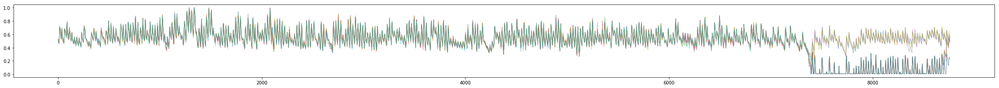

5 0.9792270531400966
2000
LOSS : 0.117
LOSS : 0.136
LOSS : 0.136
LOSS : 0.130
LOSS : 0.137
LOSS : 0.127
LOSS : 0.191


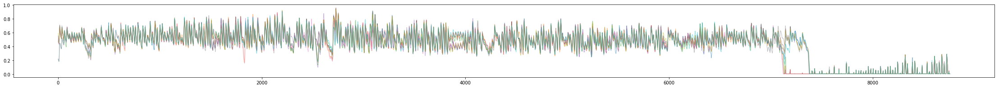

6 0.9792270531400966
2000
LOSS : 0.232
LOSS : 0.277
LOSS : 0.272
LOSS : 0.267
LOSS : 0.276
LOSS : 0.287
LOSS : 0.288


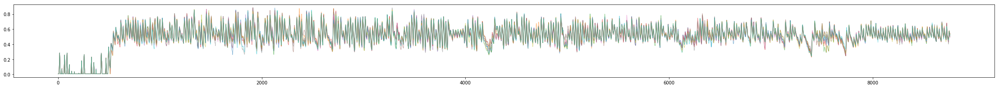

7 0.9792270531400966
2000
LOSS : 0.280
LOSS : 0.286
LOSS : 0.286
LOSS : 0.303
LOSS : 0.328
LOSS : 0.296
LOSS : 0.282


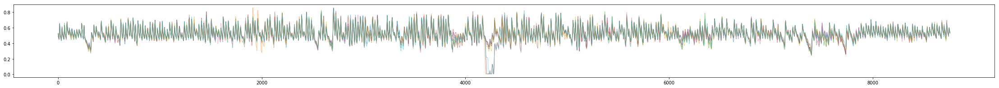

8 0.9792270531400966
2000
LOSS : 0.311
LOSS : 0.292
LOSS : 0.293
LOSS : 0.293
LOSS : 0.310
LOSS : 0.273
LOSS : 0.158
LOSS : 0.083


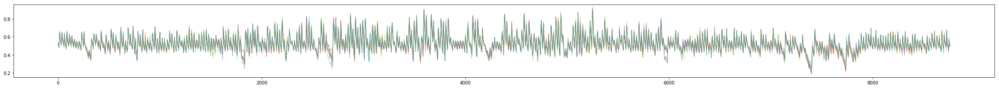

9 0.9792270531400966
2000
LOSS : 0.075
LOSS : 0.081
LOSS : 0.076
LOSS : 0.089
LOSS : 0.103
LOSS : 0.178
LOSS : 0.223


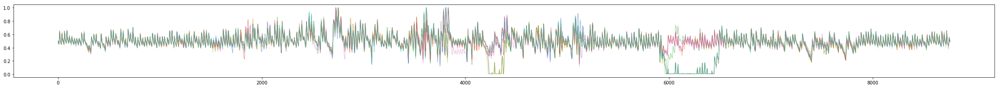

10 0.9792270531400966
2000
LOSS : 0.215
LOSS : 0.204
LOSS : 0.226
LOSS : 0.208
LOSS : 0.235
LOSS : 0.222
LOSS : 0.250


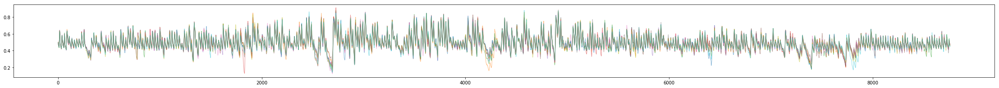

11 0.9792270531400966
2000
LOSS : 0.234
LOSS : 0.228
LOSS : 0.241
LOSS : 0.272
LOSS : 0.292
LOSS : 0.283
LOSS : 0.279


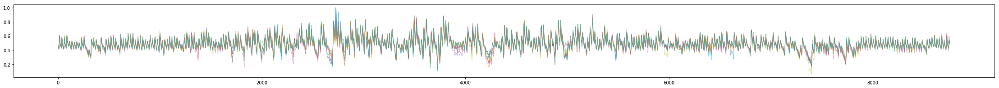

12 0.9792270531400966
2000
LOSS : 0.292
LOSS : 0.302
LOSS : 0.281
LOSS : 0.271
LOSS : 0.215
LOSS : 0.160
LOSS : 0.166
LOSS : 0.192


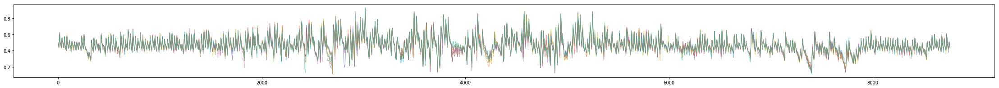

13 0.9792270531400966
2000
LOSS : 0.206
LOSS : 0.185
LOSS : 0.202
LOSS : 0.223
LOSS : 0.211
LOSS : 0.207
LOSS : 0.248


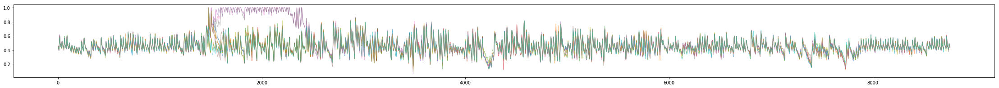

14 0.9792270531400966
2000
LOSS : 0.257
LOSS : 0.232
LOSS : 0.240
LOSS : 0.244
LOSS : 0.274
LOSS : 0.269
LOSS : 0.302


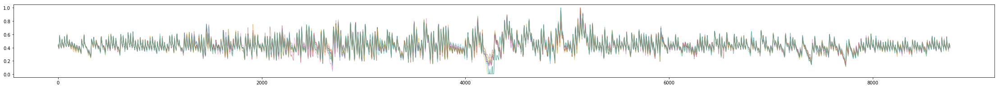

15 0.9792270531400966
2000
LOSS : 0.341
LOSS : 0.344
LOSS : 0.329
LOSS : 0.345
LOSS : 0.360
LOSS : 0.309
LOSS : 0.366


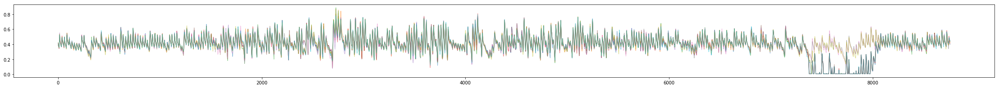

16 0.9792270531400966
2000
LOSS : 0.592
LOSS : 0.584
LOSS : 0.565
LOSS : 0.562
LOSS : 0.588
LOSS : 0.529
LOSS : 0.528
LOSS : 0.811


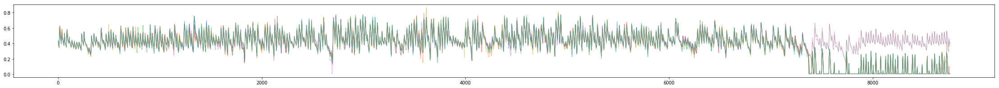

17 0.9792270531400966
2000
LOSS : 1.109
LOSS : 1.195
LOSS : 1.125
LOSS : 1.161
LOSS : 1.157
LOSS : 1.063
LOSS : 1.191


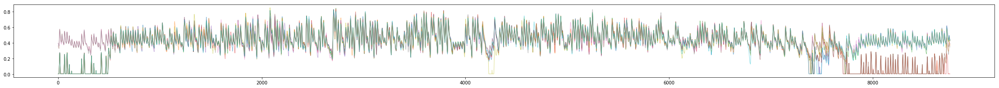

18 0.9792270531400966
2000
LOSS : 1.350
LOSS : 1.345
LOSS : 1.354
LOSS : 1.391
LOSS : 1.443
LOSS : 1.178
LOSS : 1.264


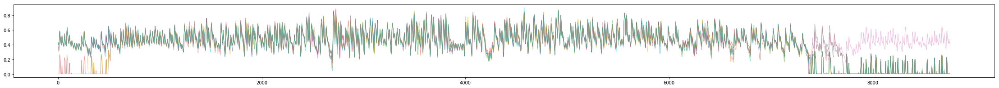

19 0.9792270531400966
2000
LOSS : 1.479
LOSS : 1.624
LOSS : 1.642
LOSS : 1.548
LOSS : 1.608
LOSS : 1.380
LOSS : 1.199


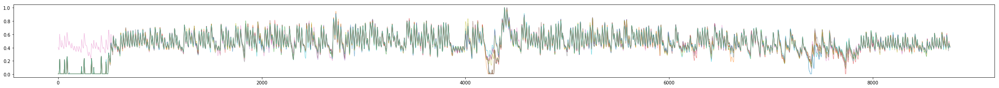

In [25]:
from figplot import figplot

ANNUAL_MEMORY = []
TOTAL_MEMORY = []

yr = 2000
dummy1 = CAPM(LOCATION, yr)
dummy1.eno = ENO(LOCATION, yr)
dummy1.HMAX = dummy1.eno.SMAX
dummy1.reset()
capm_list = [dummy1]*NO_OF_NODES

sc_EPSILON = 0.1
for iteration in range(20):
    print(iteration, sc_EPSILON)
    ANNUAL_MEMORY.clear()

    for cpm in capm_list:
        cpm.eno.day = 0
    print(capm_list[0].year)
    
    for day in range(365):
        if iteration <= 0:
            print(day, sc_EPSILON)
            A = 50
            sc_EPSILON = np.clip((0.1 + day/(day+A)),0.1,0.99)
        
        day_list = [day]*NO_OF_NODES
        sc_EPSILON_list = [sc_EPSILON]*NO_OF_NODES
        param_list = [MODEL_FILENAME]*NO_OF_NODES
        arglist = [arg for arg in zip(range(NO_OF_NODES), day_list, sc_EPSILON_list, param_list, capm_list)]
        result = pool.starmap(T_ENO, arglist)

        node_experience  = np.array([item[0] for item in result])
        capm_list = [item[1] for item in result]

        ANNUAL_MEMORY.append(node_experience)
        TOTAL_MEMORY.append(node_experience)
        all_exp = np.array([item for each_node_exp in node_experience 
                                    for episode_exp in each_node_exp 
                                        for item in episode_exp]).reshape(-1,10)

        dqn.memory = np.insert(dqn.memory, 0, all_exp , 0)
        dqn.memory = dqn.memory[:MEMORY_CAPACITY,:]
        dqn.memory_counter += all_exp.shape[0]


        if dqn.memory_counter > 24*7:#MEMORY_CAPACITY:
            for nn_iter in range(NN_ITERATIONS):
                dqn.learn()
            # SAVE MODEL
            torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)

    AN_NUAL_MEMORY = np.array(ANNUAL_MEMORY)
    MEM = np.einsum('dnes->ndes',AN_NUAL_MEMORY)
    #single file all data
    STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
    ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
    REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)
    #Destandardize state values from memory
    DSTD_STATES = batch_destdize(STATES)
    #NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
    NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
    NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)

    plt.figure(figsize=(39,3))
    for i in range(NO_OF_NODES):
        plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
    plt.show()


pool.close()
pool.join()
    
    

In [26]:
# TOTAL_MEMORY = np.array(TOTAL_MEMORY)

# MEM = np.einsum('dnes->ndes',TOTAL_MEMORY)

# #single file all data
# STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
# ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
# REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)

In [27]:
# #Destandardize state values from memory
# DSTD_STATES = batch_destdize(STATES)

In [28]:
# #NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
# NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
# NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)
# # np.save('DENO',NODE_MEMS)


In [29]:
# plt.figure(figsize=(24,3))
# plt.plot(node_0[:,0],'r')
# # plt.plot(z[:,1])
# plt.plot(node_0[:,2],'c',alpha=0.4)
# # plt.plot(node_0[:,3],'b')
# plt.plot(node_0[:,4]/9,'b')
# # plt.plot(node_0[:,5],'k--')
# plt.minorticks_on()

# plt.grid(which='both',axis='x')

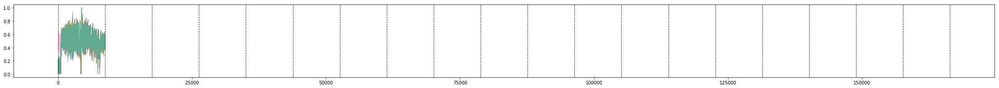

In [30]:
plt.figure(figsize=(39,3))
for i in range(NO_OF_NODES):
    plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.8)



In [31]:
batt = NODE_MEMS[:,:,0]

In [32]:
downtime_occur = (batt < 0.006).astype(int)
overflow_occur = (batt == 1).astype(int)

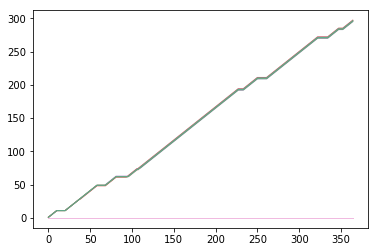

In [33]:
#DOWNTIME PER NODE WITH TIME
for i in range(NO_OF_NODES):
    plt.plot(downtime_occur[i,0:365].cumsum(), alpha=0.5, linewidth=1.0)

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

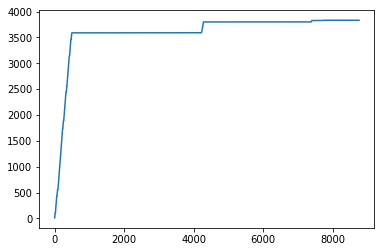

In [34]:
# OVERALL DOWNTIME OF SYSTEM

total_downtime = downtime_occur.sum(axis=0)
plt.plot(total_downtime.cumsum())

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

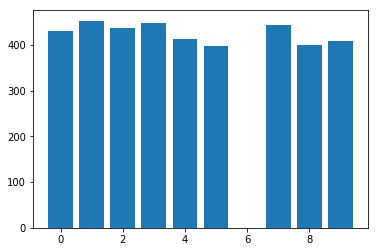

In [35]:
# TOTAL DOWNTIME PER NODE

total_downtime = downtime_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_downtime)

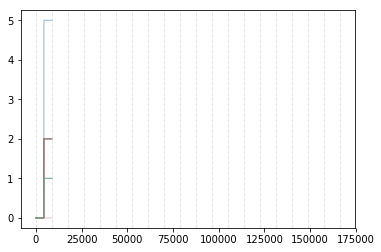

In [36]:
#OVERFLOW PER NODE WITH TIME

for i in range(NO_OF_NODES):
    plt.plot(overflow_occur[i,:].cumsum(), alpha=0.5, linewidth=1.0)
    
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

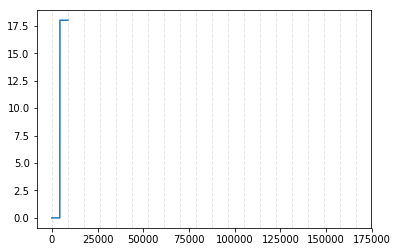

In [37]:
# OVERALL OVERFLOW OF SYSTEM

total_overflow = overflow_occur.sum(axis=0)
plt.plot(total_overflow.cumsum())

for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

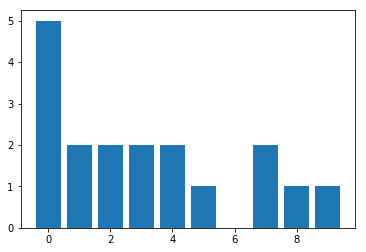

In [38]:
# TOTAL OVERFLOW  PER NODE

total_overflow = overflow_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_overflow)

In [39]:
S_FILENAME = MODEL_FILENAME
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

Loading MODEL from FILE:  ./models/DENOSTI6WR1Z__13_29_49__161.pt
DEVICE:  cpu


***MEASURING PERFORMANCE OF THE MODEL***


************************************
Day Violations           =     74
Battery Limit Violations =   1560
Battery FULL Violations  =      7
Battery EMPTY Violations =   1553


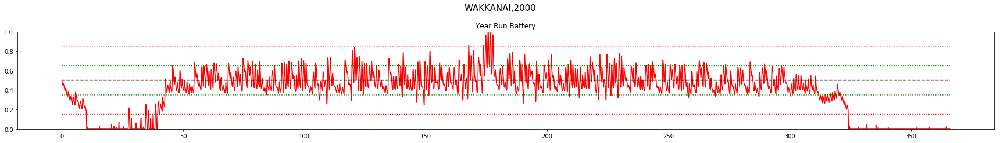



************************************
Day Violations           =    121
Battery Limit Violations =   2451
Battery FULL Violations  =      8
Battery EMPTY Violations =   2443


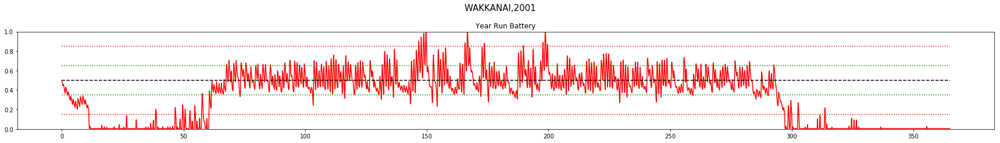



************************************
Day Violations           =     79
Battery Limit Violations =   1744
Battery FULL Violations  =      3
Battery EMPTY Violations =   1741


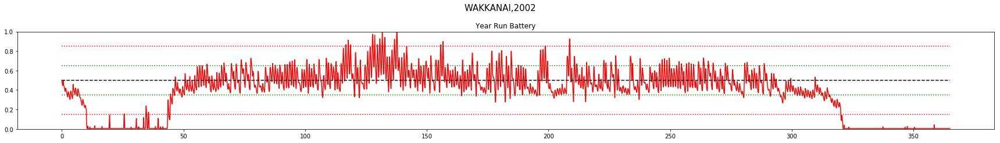



************************************
Day Violations           =     47
Battery Limit Violations =   1019
Battery FULL Violations  =      3
Battery EMPTY Violations =   1016


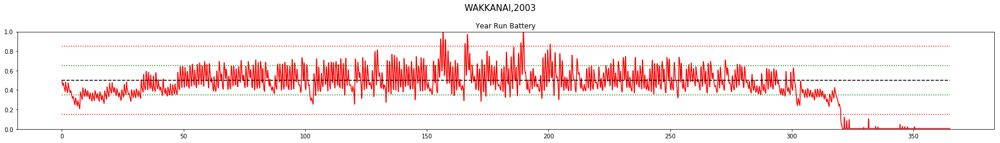



************************************
Day Violations           =     81
Battery Limit Violations =   1713
Battery FULL Violations  =      8
Battery EMPTY Violations =   1705


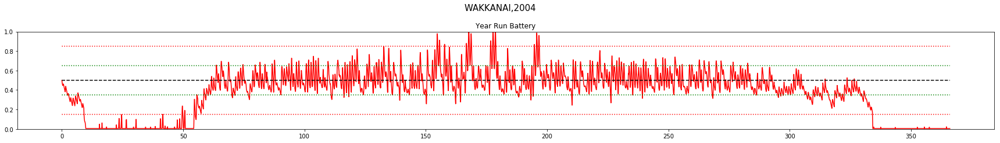



************************************
Day Violations           =     83
Battery Limit Violations =   1771
Battery FULL Violations  =      2
Battery EMPTY Violations =   1769


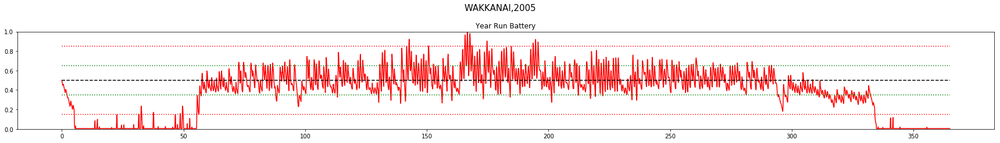



************************************
Day Violations           =     51
Battery Limit Violations =   1115
Battery FULL Violations  =      9
Battery EMPTY Violations =   1106


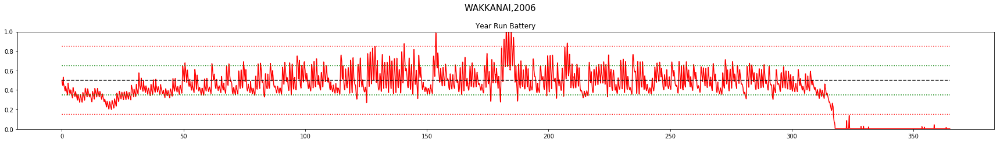



************************************
Day Violations           =     89
Battery Limit Violations =   1815
Battery FULL Violations  =      5
Battery EMPTY Violations =   1810


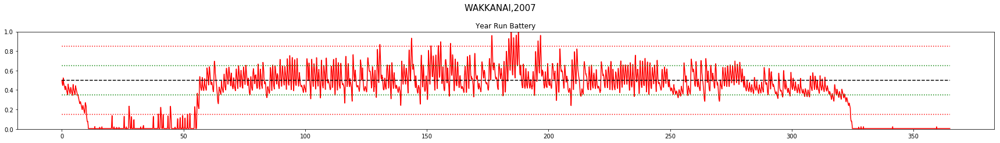



************************************
Day Violations           =     78
Battery Limit Violations =   1625
Battery FULL Violations  =      9
Battery EMPTY Violations =   1616


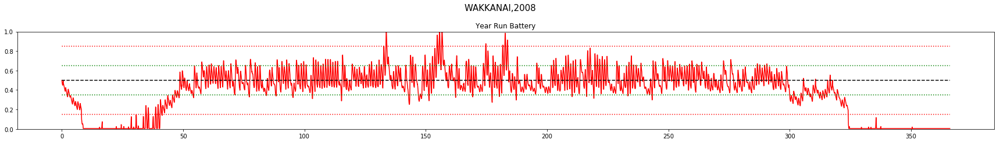



************************************
Day Violations           =     96
Battery Limit Violations =   2077
Battery FULL Violations  =      0
Battery EMPTY Violations =   2077


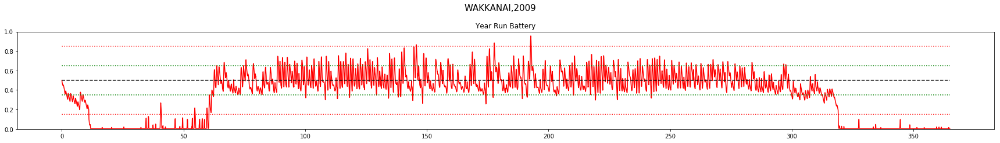



************************************
Day Violations           =     79
Battery Limit Violations =   1547
Battery FULL Violations  =     21
Battery EMPTY Violations =   1526


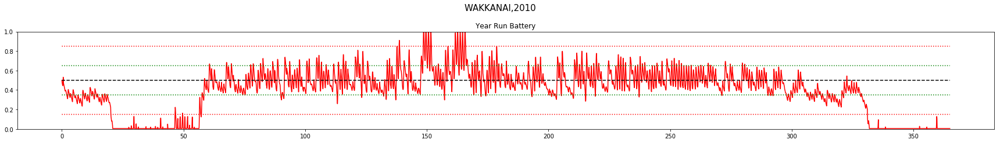



************************************
Day Violations           =     90
Battery Limit Violations =   1852
Battery FULL Violations  =      0
Battery EMPTY Violations =   1852


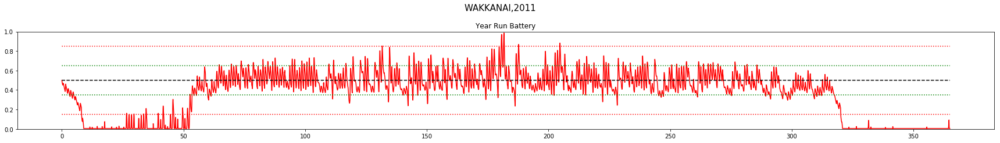



************************************
Day Violations           =     55
Battery Limit Violations =   1225
Battery FULL Violations  =      8
Battery EMPTY Violations =   1217


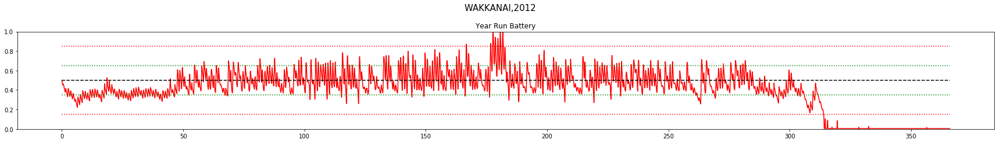



************************************
Day Violations           =     97
Battery Limit Violations =   1939
Battery FULL Violations  =     11
Battery EMPTY Violations =   1928


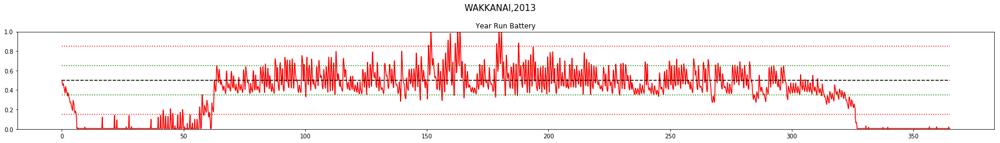



************************************
Day Violations           =     92
Battery Limit Violations =   1854
Battery FULL Violations  =     11
Battery EMPTY Violations =   1843


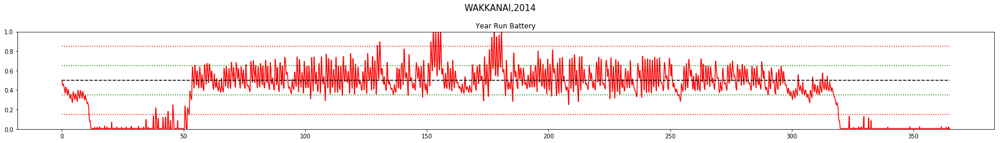



************************************
Day Violations           =     79
Battery Limit Violations =   1670
Battery FULL Violations  =      1
Battery EMPTY Violations =   1669


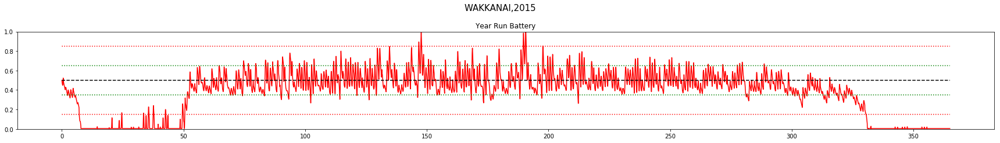



************************************
Day Violations           =    111
Battery Limit Violations =   2394
Battery FULL Violations  =      9
Battery EMPTY Violations =   2385


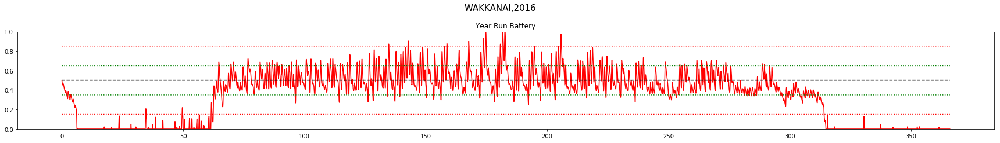



************************************
Day Violations           =     90
Battery Limit Violations =   1962
Battery FULL Violations  =      0
Battery EMPTY Violations =   1962


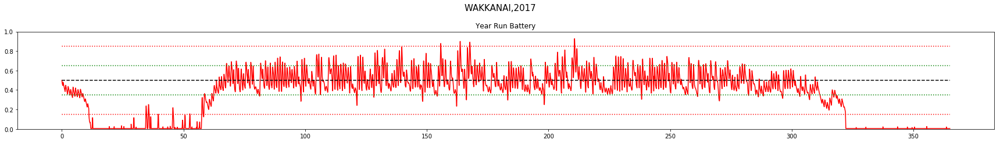



************************************
Day Violations           =     83
Battery Limit Violations =   1747
Battery FULL Violations  =     10
Battery EMPTY Violations =   1737


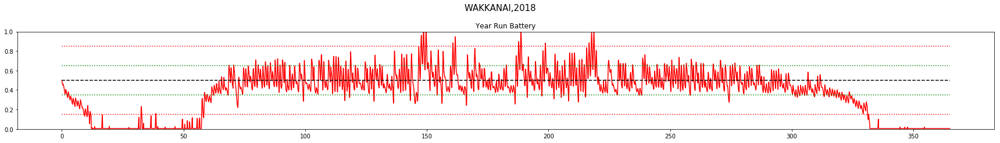



WAKKANAI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.6		74	 1560	1553	7
2001	 0.35		121	 2451	2443	8
2002	 0.55		79	 1744	1741	3
2003	 0.74		47	 1019	1016	3
2004	 0.55		81	 1713	1705	8
2005	 0.54		83	 1771	1769	2
2006	 0.71		51	 1115	1106	9
2007	 0.52		89	 1815	1810	5
2008	 0.57		78	 1625	1616	9
2009	 0.48		96	 2077	2077	0
2010	 0.59		79	 1547	1526	21
2011	 0.52		90	 1852	1852	0
2012	 0.69		55	 1225	1217	8
2013	 0.48		97	 1939	1928	11
2014	 0.52		92	 1854	1843	11
2015	 0.57		79	 1670	1669	1
2016	 0.41		111	 2394	2385	9
2017	 0.5		90	 1962	1962	0
2018	 0.53		83	 1747	1737	10

TOTAL Day  Violations:   1575.0
TOTAL Batt  Violations:  33080.0
TOTAL EMPTY Violations:  32955.0
TOTAL FULL  Violations:  125.0
************************************


************************************
Day Violations           =     64
Battery Limit Violations =   1233
Battery FULL Violations  =      0
Battery EMPTY Violations =   1233


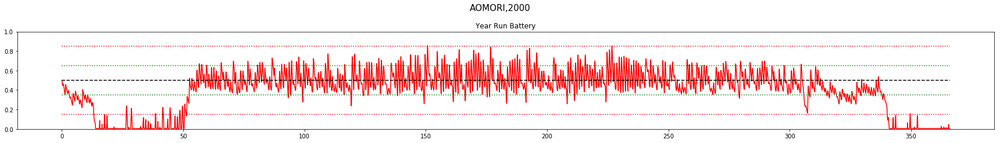



************************************
Day Violations           =     25
Battery Limit Violations =    540
Battery FULL Violations  =      2
Battery EMPTY Violations =    538


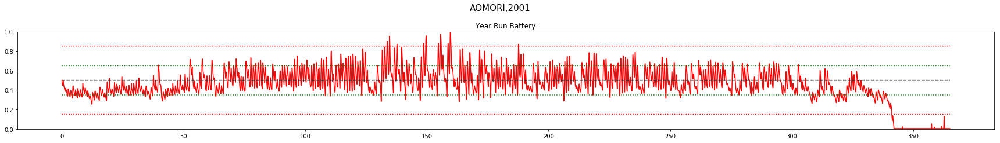



************************************
Day Violations           =     68
Battery Limit Violations =   1284
Battery FULL Violations  =      7
Battery EMPTY Violations =   1277


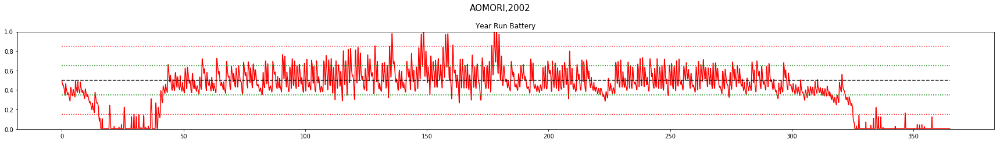



************************************
Day Violations           =     25
Battery Limit Violations =    517
Battery FULL Violations  =      6
Battery EMPTY Violations =    511


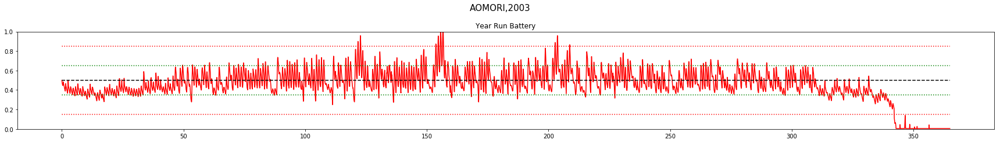



************************************
Day Violations           =     32
Battery Limit Violations =    652
Battery FULL Violations  =      7
Battery EMPTY Violations =    645


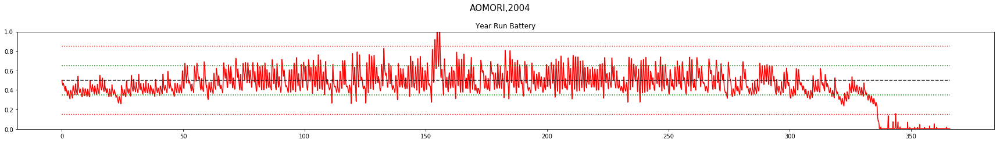



************************************
Day Violations           =     38
Battery Limit Violations =    686
Battery FULL Violations  =      3
Battery EMPTY Violations =    683


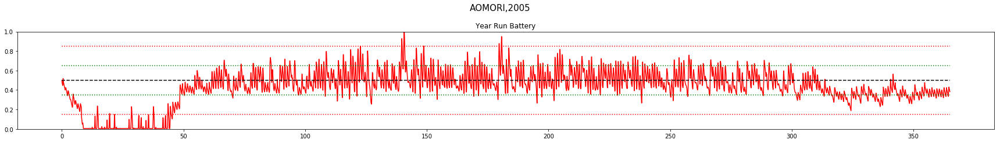



************************************
Day Violations           =     24
Battery Limit Violations =    533
Battery FULL Violations  =      0
Battery EMPTY Violations =    533


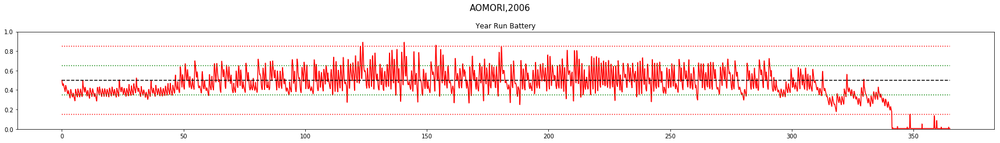



************************************
Day Violations           =     46
Battery Limit Violations =    874
Battery FULL Violations  =     18
Battery EMPTY Violations =    856


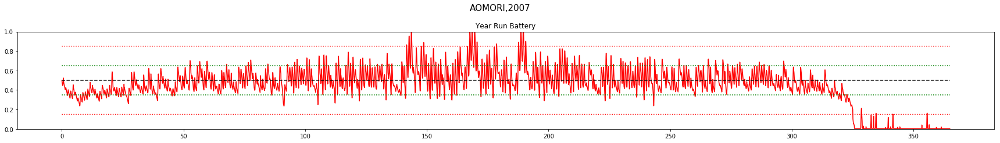



************************************
Day Violations           =      2
Battery Limit Violations =      5
Battery FULL Violations  =      5
Battery EMPTY Violations =      0


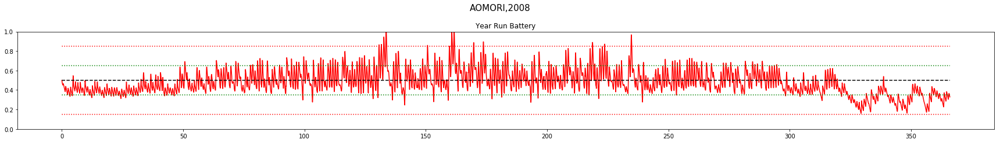



************************************
Day Violations           =     17
Battery Limit Violations =    381
Battery FULL Violations  =      0
Battery EMPTY Violations =    381


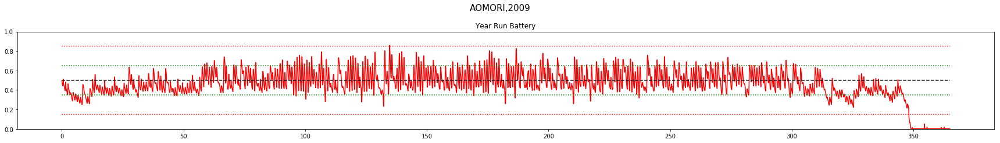



************************************
Day Violations           =     30
Battery Limit Violations =    594
Battery FULL Violations  =     12
Battery EMPTY Violations =    582


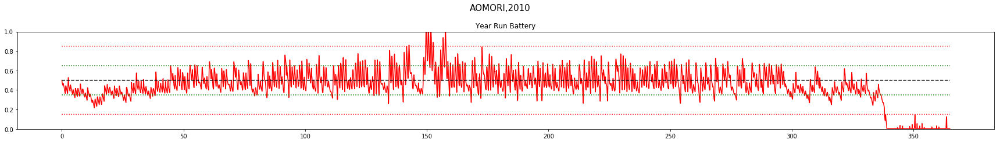



************************************
Day Violations           =     29
Battery Limit Violations =    649
Battery FULL Violations  =      0
Battery EMPTY Violations =    649


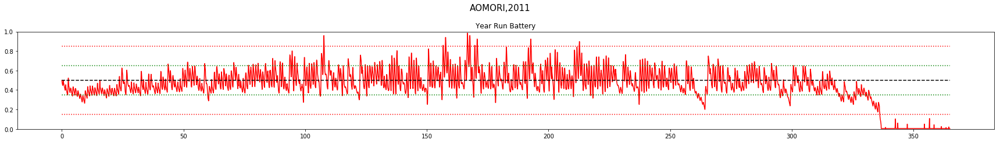



************************************
Day Violations           =     45
Battery Limit Violations =    870
Battery FULL Violations  =     19
Battery EMPTY Violations =    851


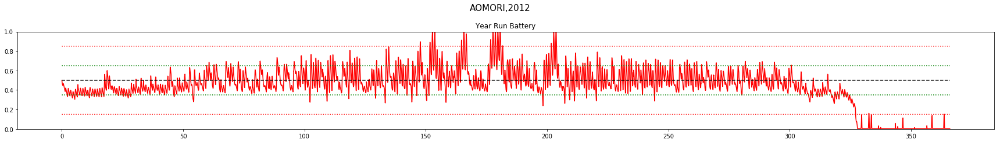



************************************
Day Violations           =      7
Battery Limit Violations =     16
Battery FULL Violations  =     16
Battery EMPTY Violations =      0


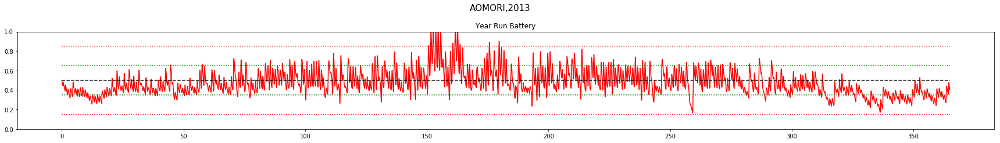



************************************
Day Violations           =     31
Battery Limit Violations =    614
Battery FULL Violations  =      7
Battery EMPTY Violations =    607


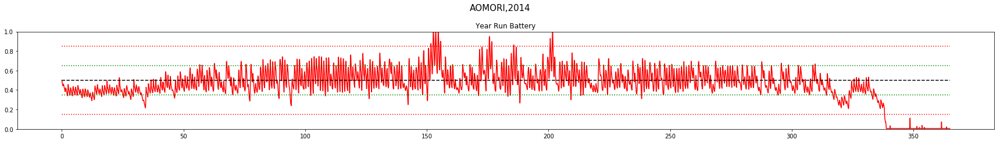



************************************
Day Violations           =     42
Battery Limit Violations =    762
Battery FULL Violations  =     15
Battery EMPTY Violations =    747


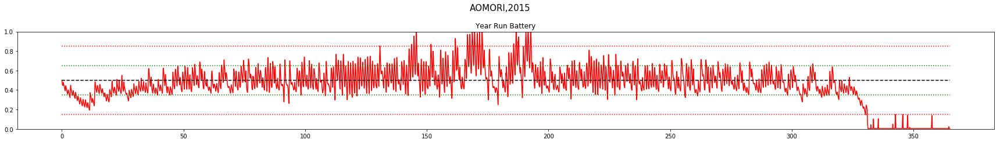



************************************
Day Violations           =      3
Battery Limit Violations =      7
Battery FULL Violations  =      7
Battery EMPTY Violations =      0


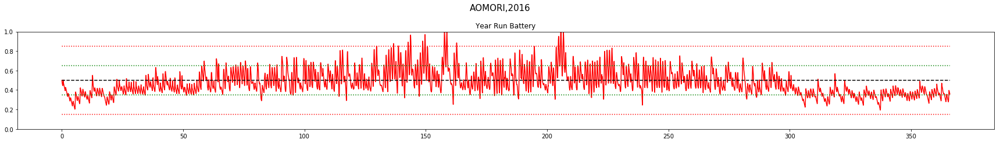



************************************
Day Violations           =     40
Battery Limit Violations =    824
Battery FULL Violations  =     10
Battery EMPTY Violations =    814


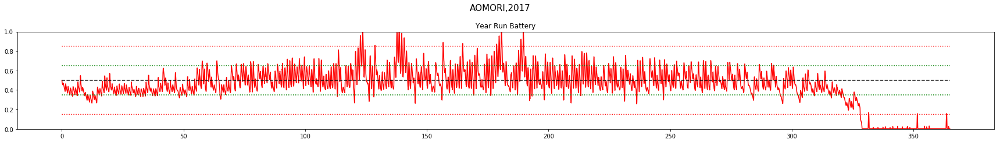



************************************
Day Violations           =     22
Battery Limit Violations =    441
Battery FULL Violations  =      4
Battery EMPTY Violations =    437


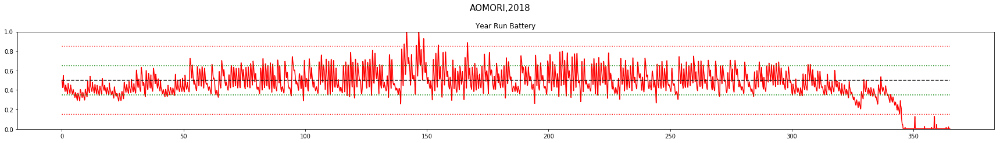



AOMORI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.66		64	 1233	1233	0
2001	 0.86		25	 540	538	2
2002	 0.63		68	 1284	1277	7
2003	 0.86		25	 517	511	6
2004	 0.83		32	 652	645	7
2005	 0.78		38	 686	683	3
2006	 0.85		24	 533	533	0
2007	 0.76		46	 874	856	18
2008	 0.95		2	 5	0	5
2009	 0.9		17	 381	381	0
2010	 0.84		30	 594	582	12
2011	 0.82		29	 649	649	0
2012	 0.77		45	 870	851	19
2013	 0.96		7	 16	0	16
2014	 0.83		31	 614	607	7
2015	 0.77		42	 762	747	15
2016	 0.97		3	 7	0	7
2017	 0.77		40	 824	814	10
2018	 0.88		22	 441	437	4

TOTAL Day  Violations:   590.0
TOTAL Batt  Violations:  11482.0
TOTAL EMPTY Violations:  11344.0
TOTAL FULL  Violations:  138.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


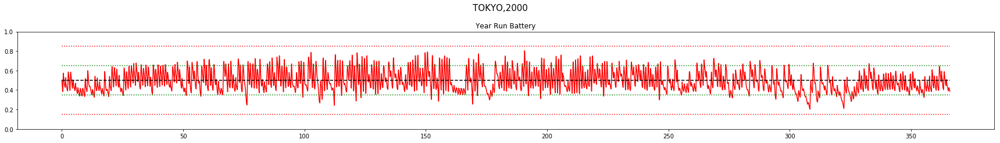



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


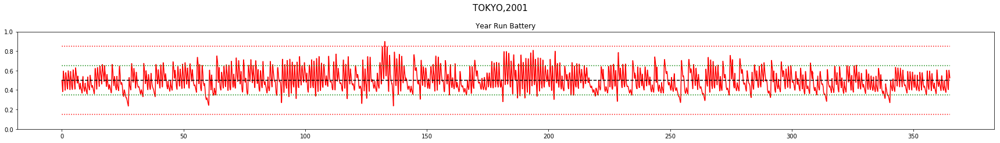



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


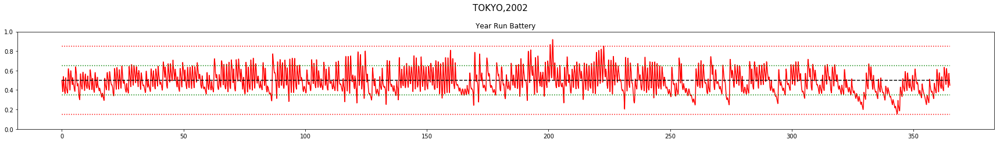



************************************
Day Violations           =      1
Battery Limit Violations =      7
Battery FULL Violations  =      0
Battery EMPTY Violations =      7


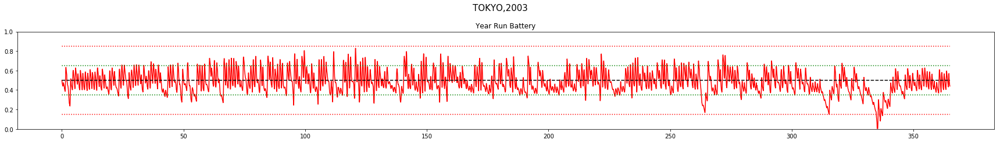



************************************
Day Violations           =      2
Battery Limit Violations =     15
Battery FULL Violations  =      0
Battery EMPTY Violations =     15


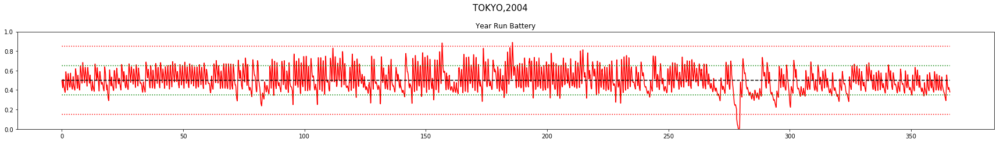



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


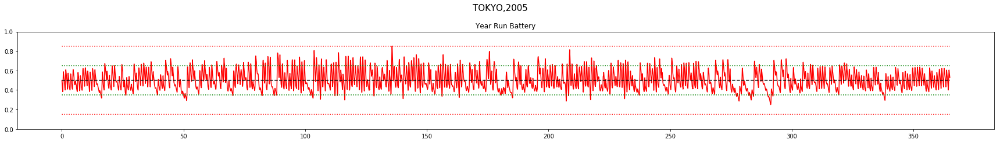



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


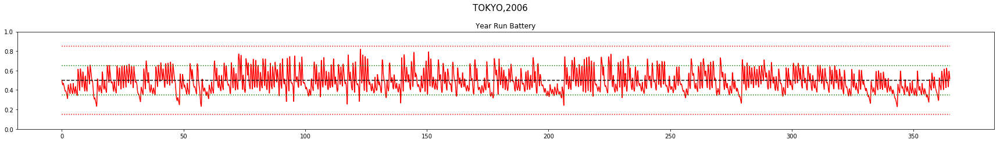



************************************
Day Violations           =      1
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


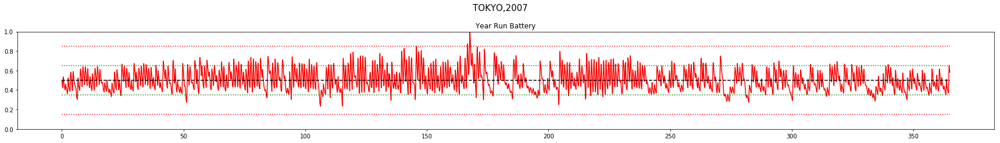



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


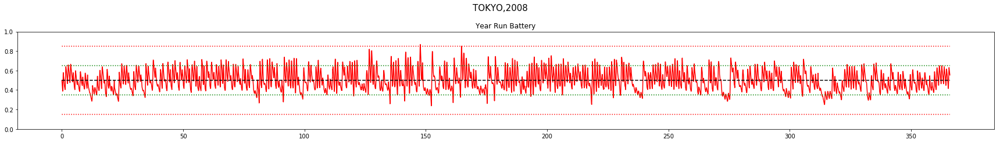



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


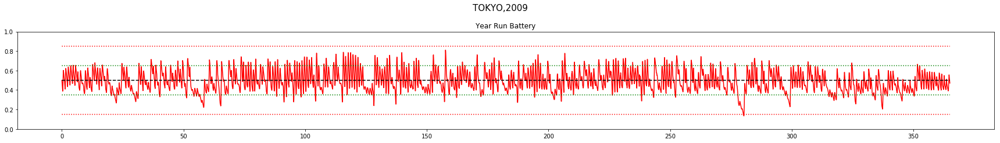



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


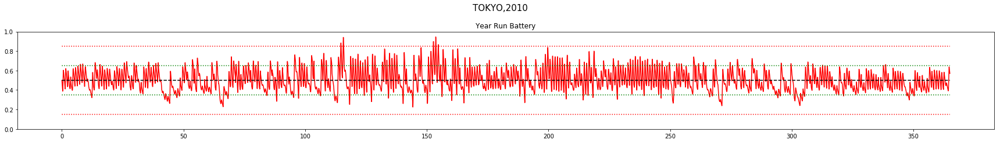



************************************
Day Violations           =      1
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


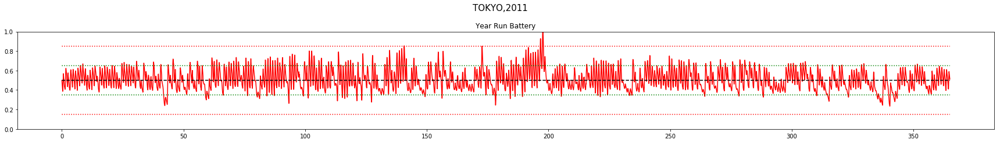



************************************
Day Violations           =      2
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


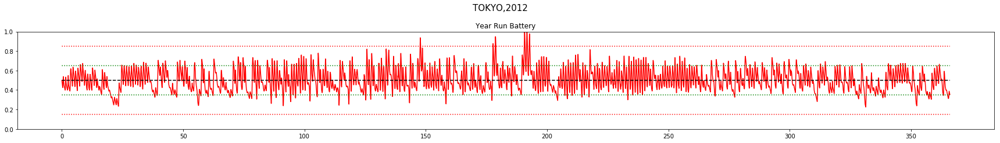



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


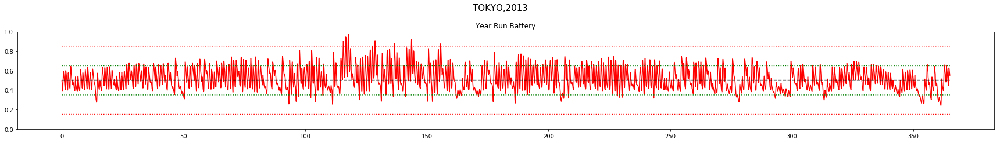



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


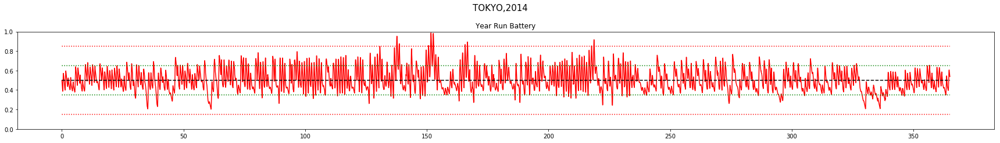



************************************
Day Violations           =      2
Battery Limit Violations =      6
Battery FULL Violations  =      6
Battery EMPTY Violations =      0


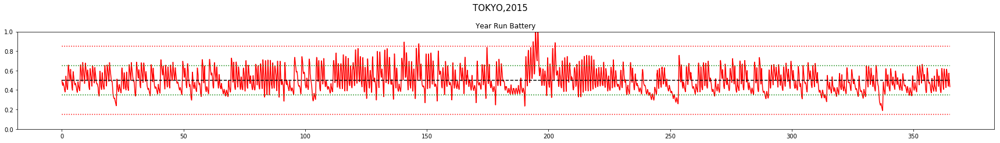



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


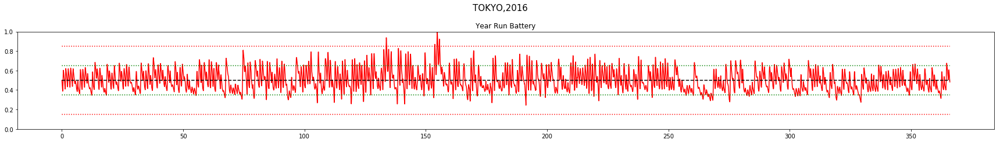



************************************
Day Violations           =     11
Battery Limit Violations =    166
Battery FULL Violations  =      0
Battery EMPTY Violations =    166


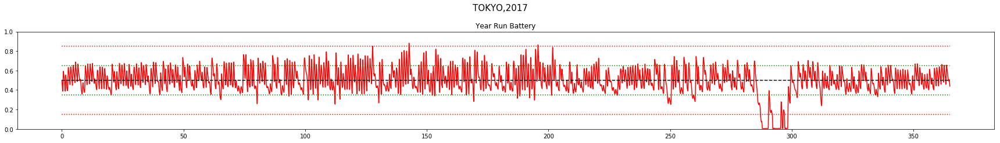



************************************
Day Violations           =      4
Battery Limit Violations =     11
Battery FULL Violations  =     11
Battery EMPTY Violations =      0


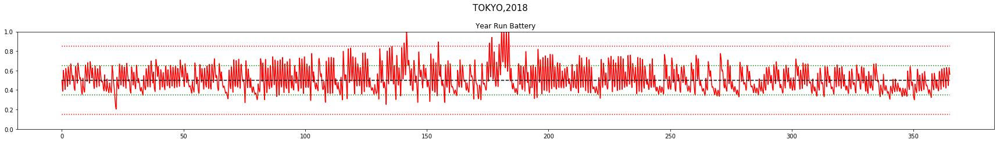



TOKYO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.99		0	 0	0	0
2001	 1.0		0	 0	0	0
2002	 0.98		0	 0	0	0
2003	 0.97		1	 7	7	0
2004	 0.99		2	 15	15	0
2005	 1.0		0	 0	0	0
2006	 1.0		0	 0	0	0
2007	 0.99		1	 1	0	1
2008	 1.0		0	 0	0	0
2009	 0.99		0	 0	0	0
2010	 0.99		0	 0	0	0
2011	 0.99		1	 3	0	3
2012	 0.98		2	 3	0	3
2013	 0.99		0	 0	0	0
2014	 0.98		0	 0	0	0
2015	 0.99		2	 6	0	6
2016	 0.99		0	 0	0	0
2017	 0.94		11	 166	166	0
2018	 0.98		4	 11	0	11

TOTAL Day  Violations:   24.0
TOTAL Batt  Violations:  212.0
TOTAL EMPTY Violations:  188.0
TOTAL FULL  Violations:  24.0
************************************


************************************
Day Violations           =      5
Battery Limit Violations =     13
Battery FULL Violations  =     13
Battery EMPTY Violations =      0


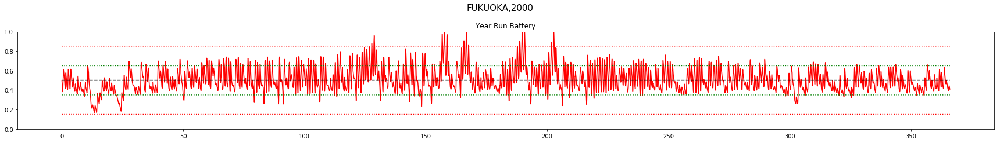



************************************
Day Violations           =      2
Battery Limit Violations =      5
Battery FULL Violations  =      5
Battery EMPTY Violations =      0


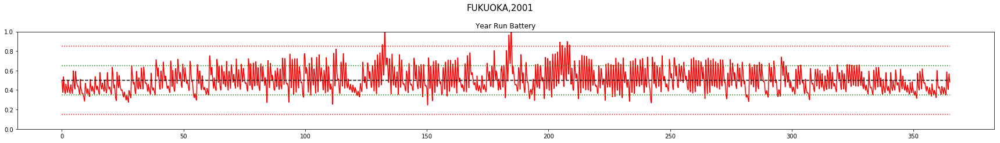



************************************
Day Violations           =      3
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


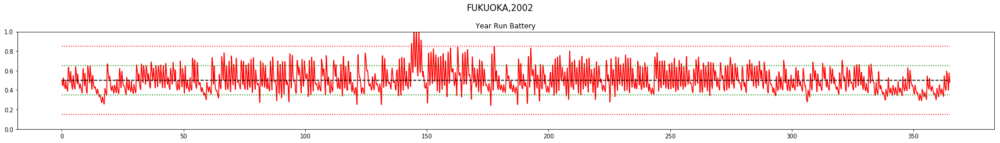



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


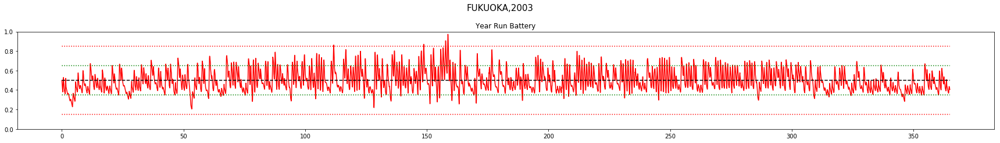



************************************
Day Violations           =      6
Battery Limit Violations =     20
Battery FULL Violations  =     20
Battery EMPTY Violations =      0


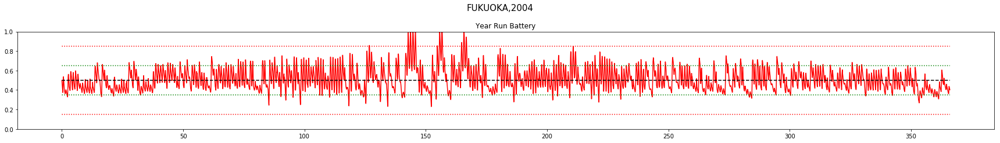



************************************
Day Violations           =      3
Battery Limit Violations =      7
Battery FULL Violations  =      7
Battery EMPTY Violations =      0


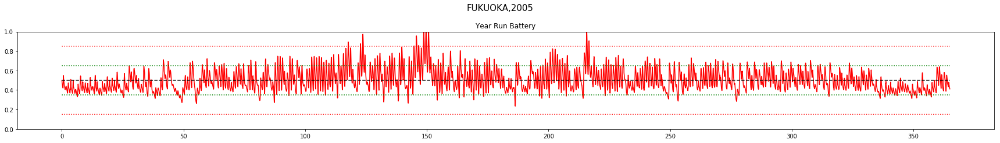



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


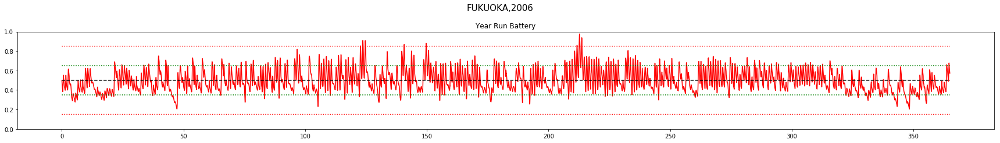



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


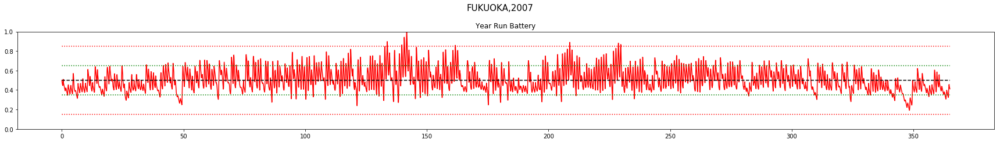



************************************
Day Violations           =      2
Battery Limit Violations =      5
Battery FULL Violations  =      5
Battery EMPTY Violations =      0


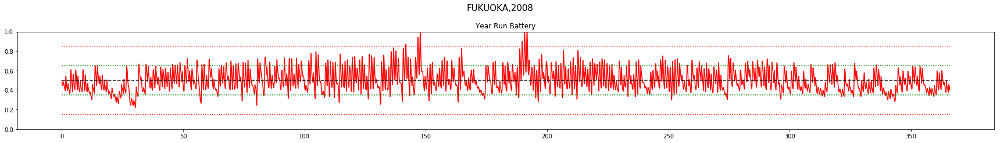



************************************
Day Violations           =     23
Battery Limit Violations =    408
Battery FULL Violations  =      0
Battery EMPTY Violations =    408


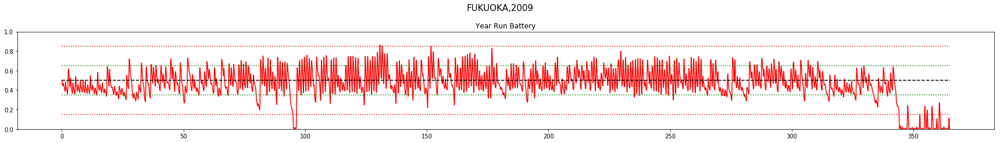



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


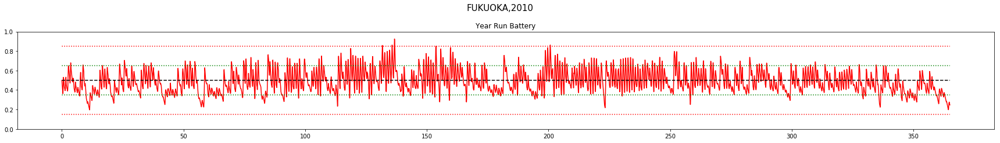



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


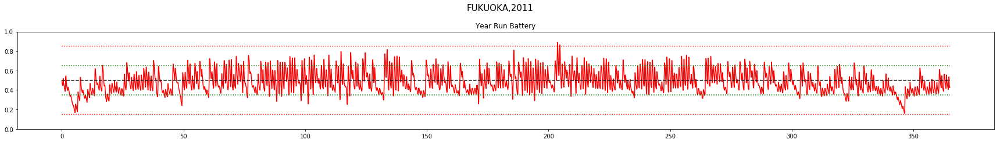



************************************
Day Violations           =      7
Battery Limit Violations =    113
Battery FULL Violations  =      0
Battery EMPTY Violations =    113


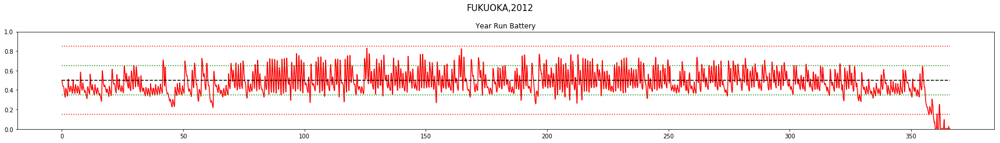



************************************
Day Violations           =      1
Battery Limit Violations =      2
Battery FULL Violations  =      2
Battery EMPTY Violations =      0


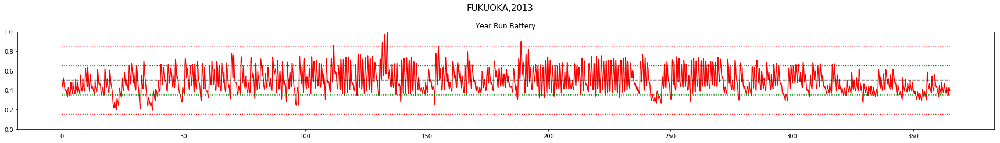



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


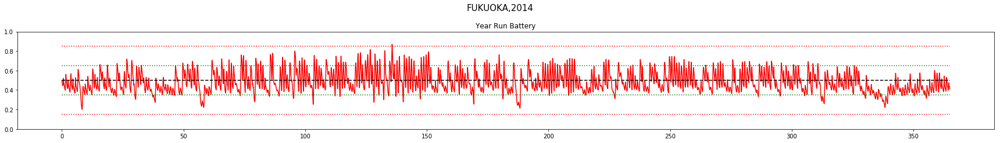



************************************
Day Violations           =      5
Battery Limit Violations =     63
Battery FULL Violations  =      2
Battery EMPTY Violations =     61


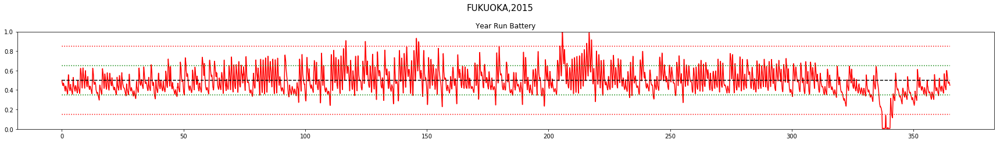



************************************
Day Violations           =      5
Battery Limit Violations =     92
Battery FULL Violations  =      0
Battery EMPTY Violations =     92


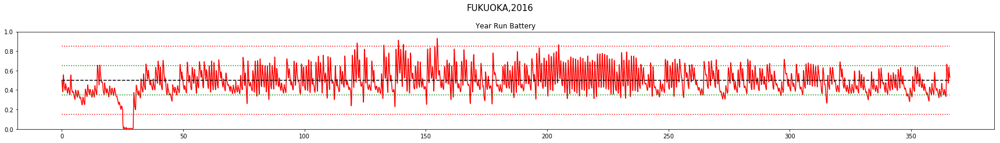



************************************
Day Violations           =      5
Battery Limit Violations =     10
Battery FULL Violations  =     10
Battery EMPTY Violations =      0


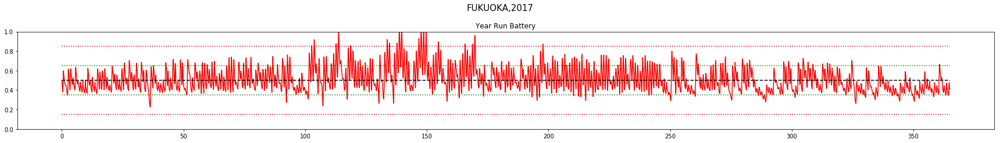



************************************
Day Violations           =      7
Battery Limit Violations =     11
Battery FULL Violations  =     11
Battery EMPTY Violations =      0


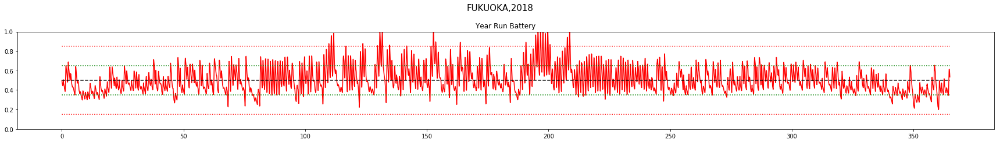



FUKUOKA
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.96		5	 13	0	13
2001	 0.99		2	 5	0	5
2002	 0.99		3	 8	0	8
2003	 0.99		0	 0	0	0
2004	 0.98		6	 20	0	20
2005	 0.98		3	 7	0	7
2006	 0.99		0	 0	0	0
2007	 0.99		0	 0	0	0
2008	 0.99		2	 5	0	5
2009	 0.88		23	 408	408	0
2010	 0.99		0	 0	0	0
2011	 0.99		0	 0	0	0
2012	 0.96		7	 113	113	0
2013	 0.98		1	 2	0	2
2014	 0.99		0	 0	0	0
2015	 0.96		5	 63	61	2
2016	 0.97		5	 92	92	0
2017	 0.98		5	 10	0	10
2018	 0.96		7	 11	0	11

TOTAL Day  Violations:   74.0
TOTAL Batt  Violations:  757.0
TOTAL EMPTY Violations:  674.0
TOTAL FULL  Violations:  83.0
************************************


************************************
Day Violations           =     10
Battery Limit Violations =     22
Battery FULL Violations  =     22
Battery EMPTY Violations =      0


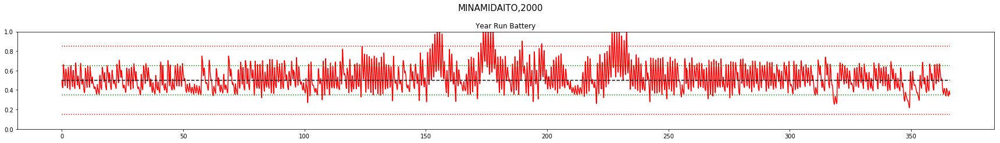



************************************
Day Violations           =     13
Battery Limit Violations =     36
Battery FULL Violations  =     36
Battery EMPTY Violations =      0


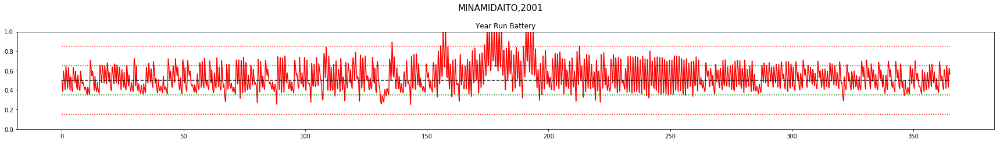



************************************
Day Violations           =      8
Battery Limit Violations =     14
Battery FULL Violations  =     14
Battery EMPTY Violations =      0


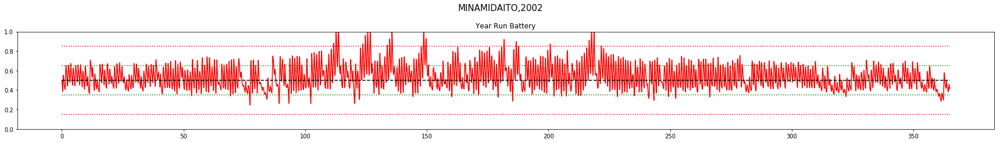



************************************
Day Violations           =     16
Battery Limit Violations =     48
Battery FULL Violations  =     48
Battery EMPTY Violations =      0


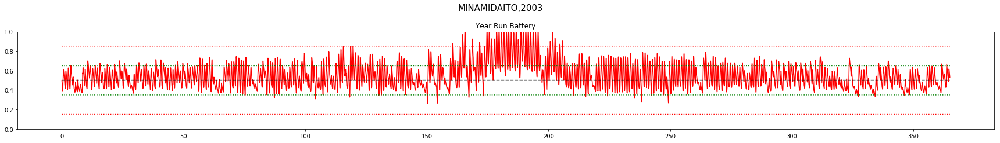



************************************
Day Violations           =      6
Battery Limit Violations =     18
Battery FULL Violations  =     18
Battery EMPTY Violations =      0


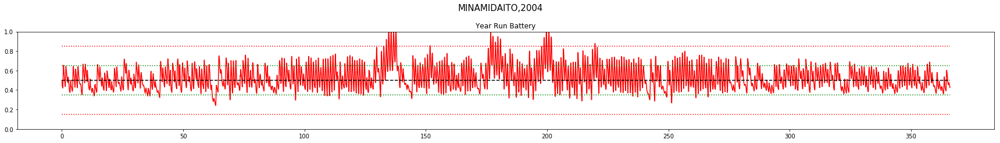



************************************
Day Violations           =      7
Battery Limit Violations =     49
Battery FULL Violations  =      8
Battery EMPTY Violations =     41


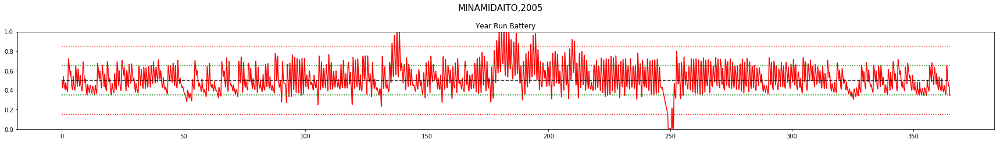



************************************
Day Violations           =     10
Battery Limit Violations =     30
Battery FULL Violations  =     30
Battery EMPTY Violations =      0


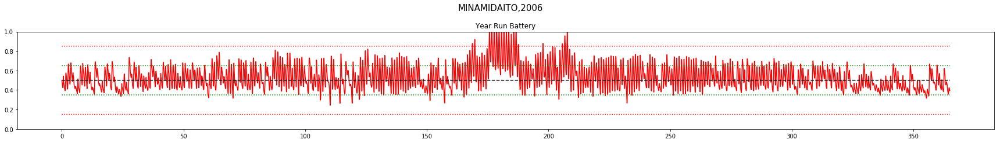



************************************
Day Violations           =     12
Battery Limit Violations =     37
Battery FULL Violations  =     37
Battery EMPTY Violations =      0


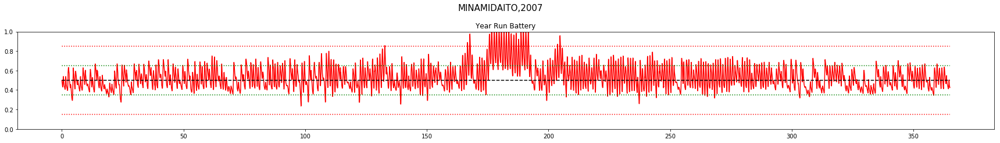



************************************
Day Violations           =      6
Battery Limit Violations =     15
Battery FULL Violations  =     15
Battery EMPTY Violations =      0


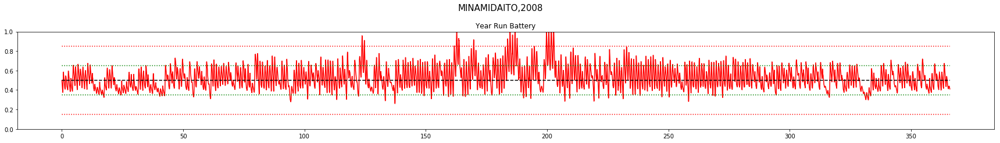



************************************
Day Violations           =     17
Battery Limit Violations =     67
Battery FULL Violations  =     35
Battery EMPTY Violations =     32


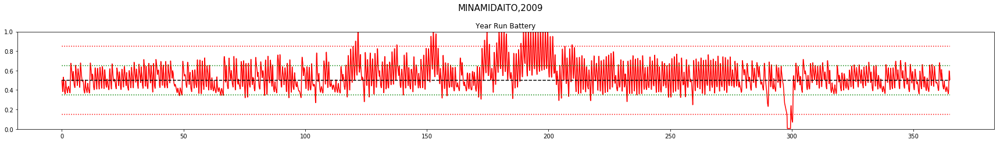



************************************
Day Violations           =      5
Battery Limit Violations =     15
Battery FULL Violations  =     15
Battery EMPTY Violations =      0


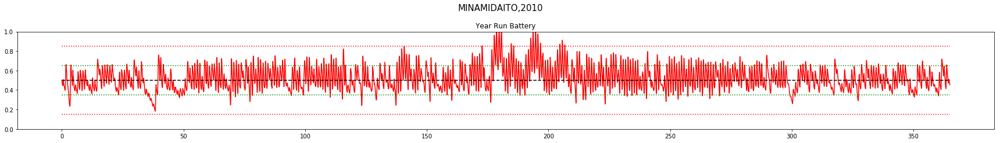



************************************
Day Violations           =     11
Battery Limit Violations =     25
Battery FULL Violations  =     25
Battery EMPTY Violations =      0


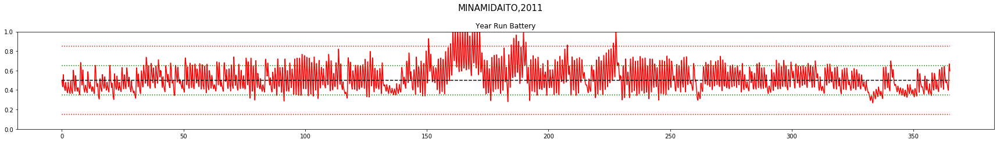



************************************
Day Violations           =     11
Battery Limit Violations =    101
Battery FULL Violations  =     16
Battery EMPTY Violations =     85


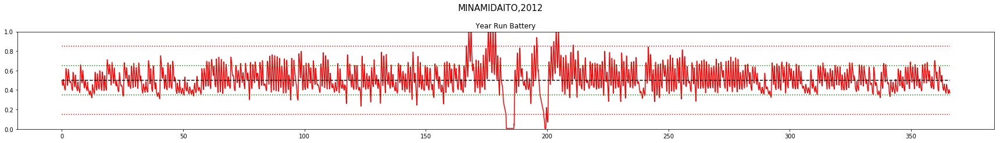



************************************
Day Violations           =      8
Battery Limit Violations =     25
Battery FULL Violations  =     25
Battery EMPTY Violations =      0


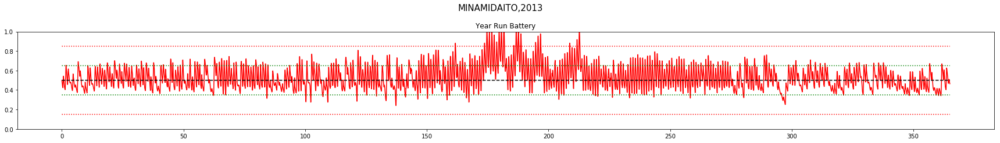



************************************
Day Violations           =      2
Battery Limit Violations =      6
Battery FULL Violations  =      6
Battery EMPTY Violations =      0


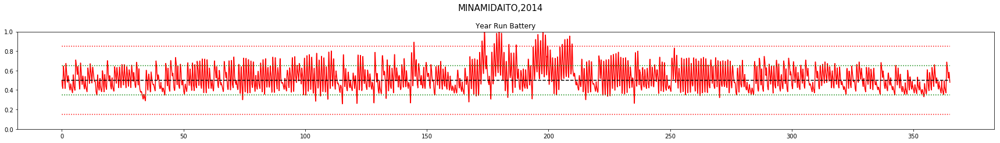



************************************
Day Violations           =     14
Battery Limit Violations =     40
Battery FULL Violations  =     40
Battery EMPTY Violations =      0


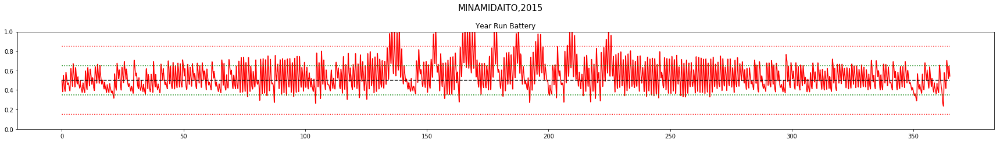



************************************
Day Violations           =     15
Battery Limit Violations =     48
Battery FULL Violations  =     48
Battery EMPTY Violations =      0


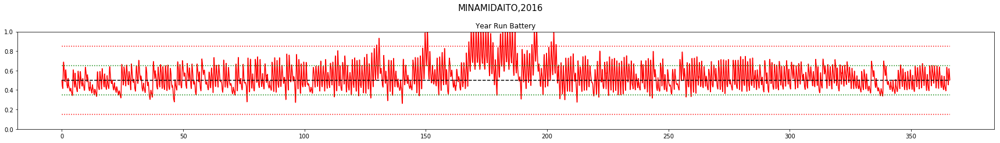



************************************
Day Violations           =     14
Battery Limit Violations =     38
Battery FULL Violations  =     38
Battery EMPTY Violations =      0


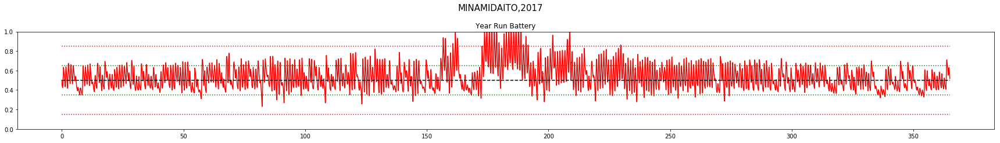



************************************
Day Violations           =      7
Battery Limit Violations =     17
Battery FULL Violations  =     17
Battery EMPTY Violations =      0


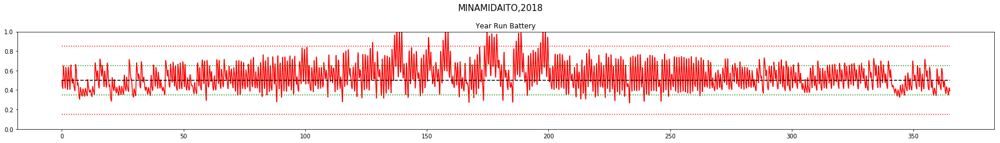



MINAMIDAITO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.96		10	 22	0	22
2001	 0.96		13	 36	0	36
2002	 0.97		8	 14	0	14
2003	 0.93		16	 48	0	48
2004	 0.97		6	 18	0	18
2005	 0.95		7	 49	41	8
2006	 0.96		10	 30	0	30
2007	 0.95		12	 37	0	37
2008	 0.97		6	 15	0	15
2009	 0.93		17	 67	32	35
2010	 0.98		5	 15	0	15
2011	 0.95		11	 25	0	25
2012	 0.95		11	 101	85	16
2013	 0.96		8	 25	0	25
2014	 0.97		2	 6	0	6
2015	 0.94		14	 40	0	40
2016	 0.94		15	 48	0	48
2017	 0.95		14	 38	0	38
2018	 0.96		7	 17	0	17

TOTAL Day  Violations:   192.0
TOTAL Batt  Violations:  651.0
TOTAL EMPTY Violations:  158.0
TOTAL FULL  Violations:  493.0
************************************


In [40]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
for LOCATION in ['wakkanai','aomori','tokyo','fukuoka','minamidaito']:
    results = np.empty(6)
    for YEAR in np.arange(2000,2019):
        capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
        capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
        capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

        s, r, day_end, year_end = capm.reset()
        yr_test_record = np.empty(4)

        while True:
            a = dqn.choose_greedy_action(stdize(s))
            yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
            s_, r, day_end, year_end = capm.step(a)
            if year_end:
                break
            s = s_

        yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
        yr_test_reward_rec = yr_test_record[:,2]
        yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
        results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations), int(capm.batt_empty_counter), int(capm.batt_full_counter)]))
        print("\n\n************************************")
        print("Day Violations           = {:6d}".format(capm.violation_counter))
        print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
        print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
        print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    ###########################################################################################
    ###########################################################################################
        #     Plot the reward and battery for the entire year run
        title = LOCATION.upper() + ',' + str(YEAR)
        NO_OF_DAYS = capm.eno.NO_OF_DAYS

        fig = plt.figure(figsize=(24,6))
        fig.suptitle(title, fontsize=15)

    #         ax1 = fig.add_subplot(211)
    #         ax1.plot(yr_test_reward_rec)
    #         ax1.set_title("\n\nYear Run Reward")
    #         ax1.set_ylim([-4,2])

        ax2 = fig.add_subplot(211)
        ax2.plot(yr_test_record[:,0],'r')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')

        ax2.set_title("\n\nYear Run Battery")
        ax2.set_ylim([0,1])
        plt.sca(ax2)
        plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
        fig.tight_layout()
        plt.show()
    ###########################################################################################
    ###########################################################################################


    results = np.delete(results,0,0)
    print("\n")
    print(LOCATION.upper())
    print('YEAR\tAVG_RWD\t\tVIOLATIONS\tEMPTY\tFULL')
    print('\t\t\tDAY\tBATT')

    for x in np.arange(0,results.shape[0]):
        print('{}\t {}\t\t{}\t {}\t{}\t{}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,3]), int(results[x,4]),  int(results[x,5]) ))

    print("\nTOTAL Day  Violations:  ",np.sum(results[:, 2]))
    print("TOTAL Batt  Violations: ",np.sum(results[:,3]))
    print("TOTAL EMPTY Violations: ",np.sum(results[:,4]))
    print("TOTAL FULL  Violations: ",np.sum(results[:,5]))
    print("************************************")